In [17]:
import numpy as np
import xgboost as xgb
from  sklearn.svm import SVC
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import pywt

In [11]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
# Function for model evaluation
def eval_model(y_test, predictions):
    """
    This function evaluates model using four metrics
    inputs:
    y_test: ground truth
    predictions: results of our model

    """

    print("Accuracy of Model:",accuracy_score(y_test,predictions))
    print("F1 score of Model:",f1_score(y_test,predictions))
    print("Precision score of Model:",precision_score(y_test,predictions))
    print("Recall score of Model:",recall_score(y_test,predictions))

# Loading data and data exploration

In [4]:
# Loading data

# Raw dataset should be downloaded from the website
# dataset = np.load('data.npy') 
labels = np.load('./Data/PhysioNet/labels.npy')

# Labels for graph visualizations
new_labels = ['Survived' if x == 0 else "Died" for x in labels]

FEATURES = {'Age': 0,
            'Gender': 1,
            'Height': 2,
            'ICUType': 3,
            'Weight': 4,
            'Albumin': 5,
            'ALP': 6,
            'ALT': 7,
            'AST': 8,
            'Bilirubin': 9,
            'BUN': 10,
            'Cholesterol': 11,
            'Creatinine': 12,
            'DiasABP': 13,
            'FiO2': 14,
            'GCS': 15,
            'Glucose': 16,
            'HCO3': 17,
            'HCT': 18,
            'HR': 19,
            'K': 20,
            'Lactate': 21,
            'Mg': 22,
            'MAP': 23,
            'MechVent': 24,
            'Na': 25,
            'NIDiasABP': 26,
            'NIMAP': 27,
            'NISysABP': 28,
            'PaCO2': 29,
            'PaO2': 30,
            'pH': 31,
            'Platelets': 32,
            'RespRate': 33,
            'SaO2': 34,
            'SysABP': 35,
            'Temp': 36,
            'TroponinI': 37,
            'TroponinT': 38,
            'Urine': 39,
            'WBC': 40}

/opt/homebrew/Caskroom/miniforge/base/envs/wizualizacje/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


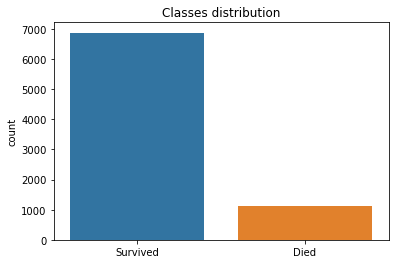

In [4]:
sns.countplot(new_labels)
plt.title('Classes distribution')
plt.show()

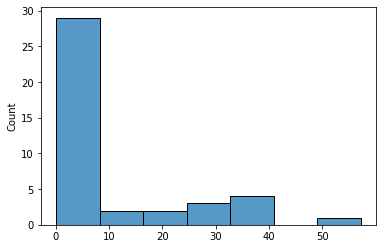

In [6]:
arr = np.mean(np.count_nonzero(~np.isnan(dataset), axis=1), axis=1)
sns.histplot(arr)
plt.show()

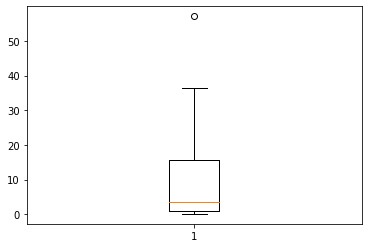

In [57]:
plt.boxplot(arr)
plt.show()

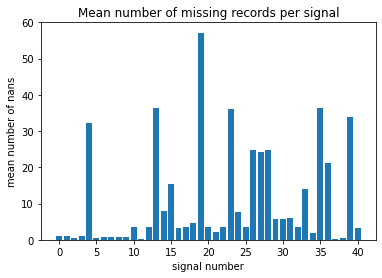

In [7]:
plt.bar(x = range(0,41), height = arr)
plt.title("Mean number of missing records per signal")
plt.xlabel("signal number")
plt.ylabel("mean number of nans")
plt.show()

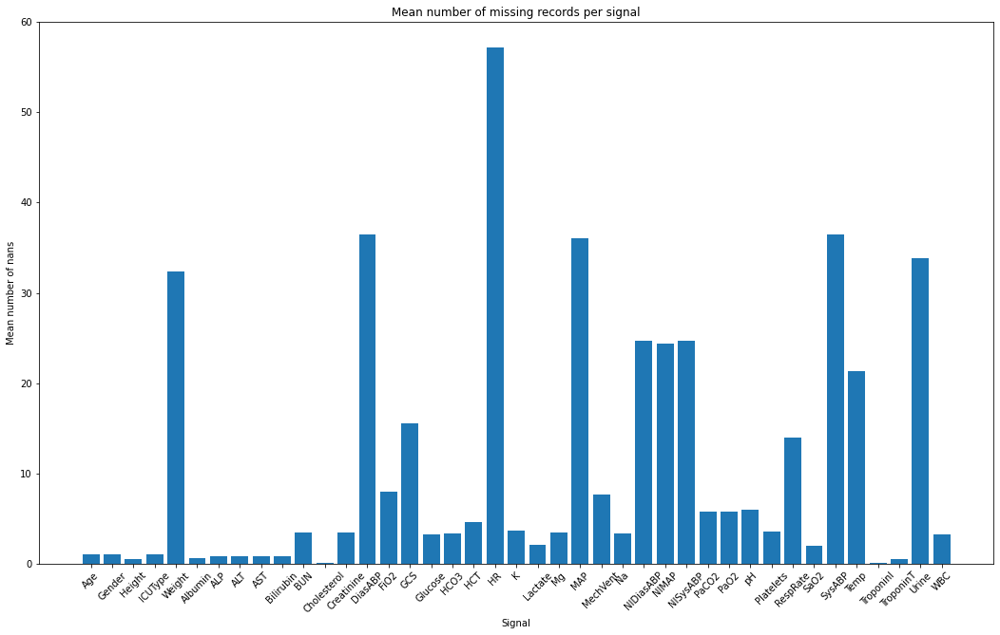

In [69]:
fig = plt.gcf()
fig.set_size_inches(18, 10.5)
plt.bar(x = FEATURES.keys(), height = arr)
plt.title("Mean number of missing records per signal")
plt.xlabel("Signal")
plt.ylabel("Mean number of nans")
plt.xticks(rotation = 45) 
plt.show()

In [8]:
#Loading bucketed data
dataset_reduced = np.load('./Data/PhysioNet/data_reduced.npy')

# Creating baseline model

In [10]:
X_train, X_test, y_train, y_test = train_test_split(dataset_reduced.reshape(8000,41*192), labels, test_size = 0.2, random_state = 0)

In [12]:
from sklearn.metrics import accuracy_score, f1_score
X_train, X_test, y_train, y_test = train_test_split(dataset_reduced.reshape(8000,41*192), labels, test_size = 0.2, random_state = 0)

xgb_classifier = xgb.XGBClassifier()
xgb_classifier.fit(X_train,y_train)
predictions = xgb_classifier.predict(X_test)
eval_model(y_test, predictions)

/opt/homebrew/Caskroom/miniforge/base/envs/wizualizacje/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:53:17] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117899018/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy of Model: 0.861875
F1 score of Model: 0.008968609865470852
Precision score of Model: 0.16666666666666666
Recall score of Model: 0.004608294930875576


Zamienienie brakujących wartości na mean lub tez 0 

In [14]:
from sklearn.decomposition import PCA
for i in range(8000):
    #Calculating the mean of each row in the dataset.
    row_mean = np.nanmean(dataset_reduced[:,:,i], axis=1)
    row_mean[np.isnan(row_mean) == True] = 0.0
    dataset_reduced[:,:,i] = [np.nan_to_num(row, row_mean[idx]) for idx,row in enumerate(dataset_reduced[:,:,i])]



/var/folders/mz/z5pmddqn7px09crhvhsl357r0000gn/T/ipykernel_9081/2750842561.py:4: RuntimeWarning: Mean of empty slice
  row_mean = np.nanmean(dataset_reduced[:,:,i], axis=1)


In [15]:
# Checking SVM performance on unprocessed data
X_train, X_test, y_train, y_test = train_test_split(dataset_reduced.reshape(8000,41*192), labels, test_size = 0.2, random_state = 0)

svm_classifier = SVC()
svm_classifier.fit(X_train,y_train)
predictions = svm_classifier.predict(X_test)
eval_model(y_test, predictions)

Accuracy of Model: 0.864375
F1 score of Model: 0.0
Precision score of Model: 0.0
Recall score of Model: 0.0


/opt/homebrew/Caskroom/miniforge/base/envs/wizualizacje/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Wavelet transform

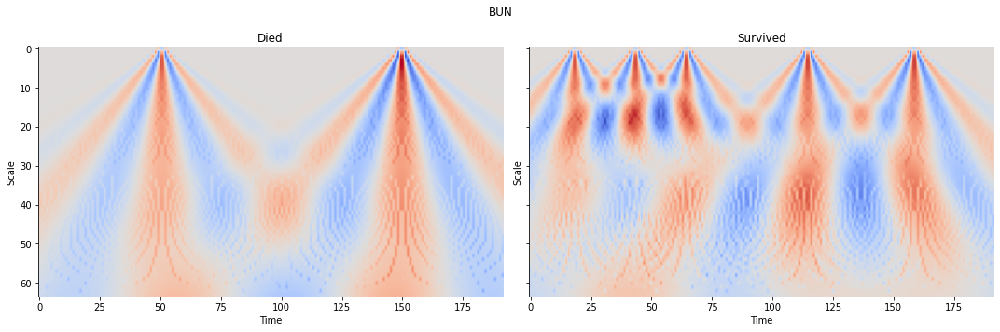

In [80]:
import pywt
import matplotlib.pyplot as plt
import numpy as np

#Creating a list of lists of the indicies of the labels.
def split_indices_per_label(y):
    indicies_per_label = [[] for x in range(0,2)]
    # loop over the six labels
    for i in range(2): 
        indicies_per_label[i] = np.where(y == i)[0]
    return indicies_per_label


def plot_cwt_coeffs_per_label(X, label_indicies, label_names, signal, sample, scales, wavelet):
    
    fig, axs = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True, figsize=(15,5))
    fig.suptitle(str(list(FEATURES.keys())[signal]))
    for ax, indices, name in zip(axs.flat, label_indicies, label_names):
        # apply  PyWavelets continuous wavelet transfromation function
        coeffs, freqs = pywt.cwt(X[signal,:,indices[sample]], scales, wavelet = wavelet)
        # create scalogram
        ax.imshow(coeffs, cmap = 'coolwarm', aspect = 'auto')
        ax.set_title(name)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.set_ylabel('Scale')
        ax.set_xlabel('Time')
    plt.tight_layout()


# list of list of sample indicies per activity
train_labels_indicies = split_indices_per_label(labels)

signal = 10 # signal index
sample = 1000 # sample index of each label indicies list
scales = np.arange(1, 65) # range of scales
wavelet = 'morl' # mother wavelet

plot_cwt_coeffs_per_label(dataset_reduced, train_labels_indicies, ["Died", "Survived"], signal, sample, scales, wavelet)

/var/folders/mz/z5pmddqn7px09crhvhsl357r0000gn/T/ipykernel_50062/2974100677.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True, figsize=(15,5))


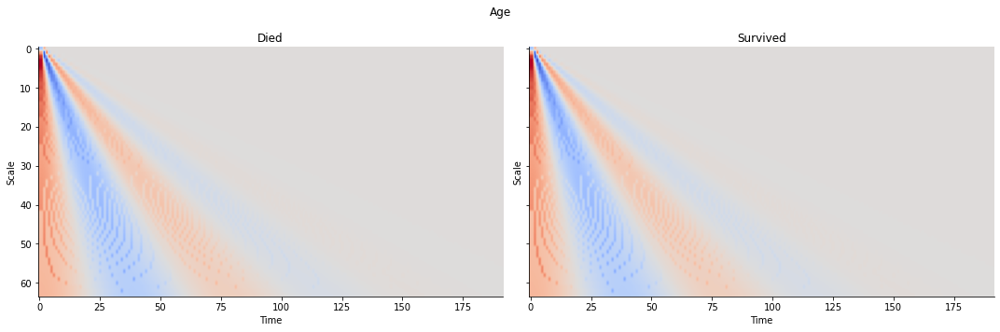

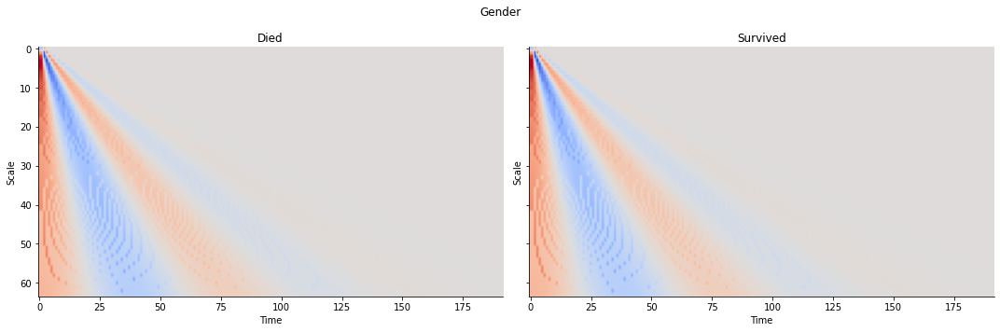

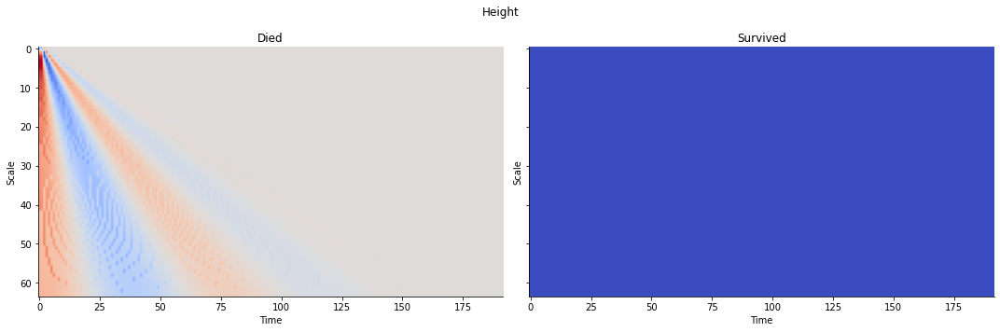

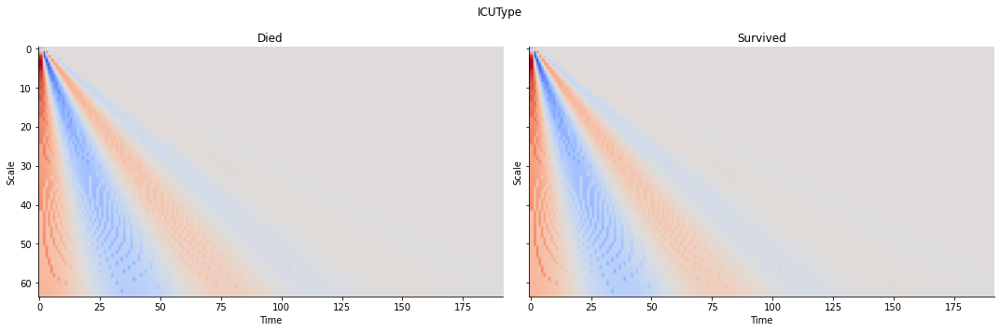

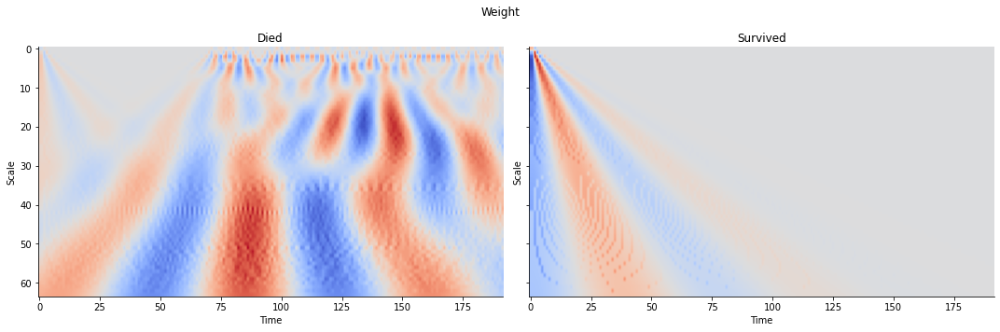

...

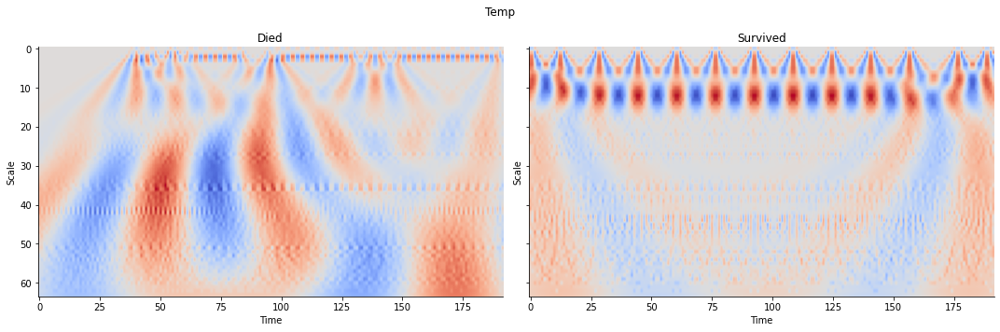

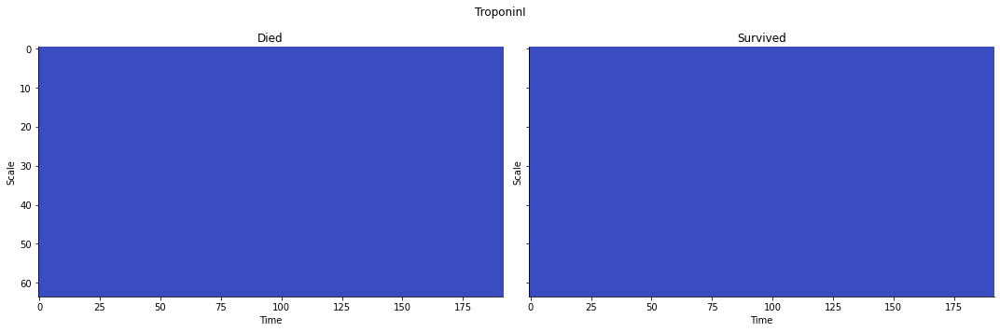

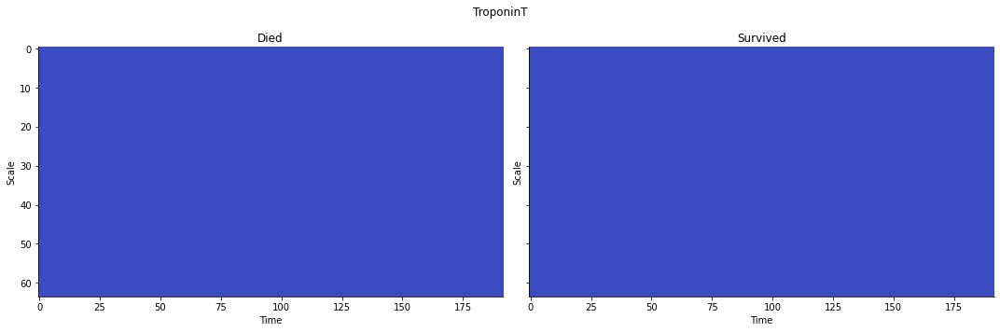

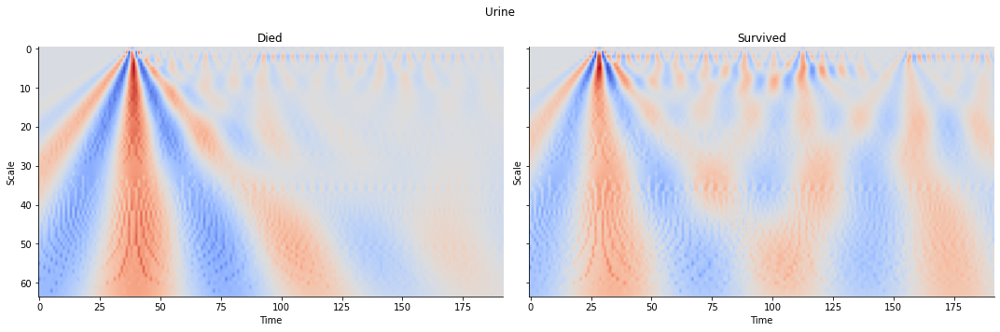

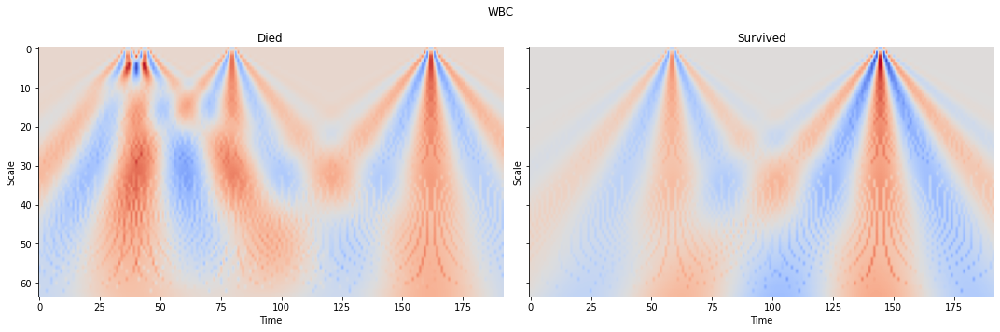

In [81]:
sample = 50
for signal in range(0,41):
    plot_cwt_coeffs_per_label(dataset_reduced, train_labels_indicies, ["Died", "Survived"], signal, sample, scales, wavelet)

In [23]:
# Transforming the whole dataset first with wavelet transform, then with PCA

def pca_of_cwt_coeffs(X, n_scales, wavelet_name="morl"):
    # apply PCA for just a single component to get the most significant coefficient per scale
    pca = PCA(n_components = 1)
    # create range of scales
    scales = np.arange(1, n_scales + 1)
    
    X_pca = np.array([])  
    for signal in range(X.shape[0]):
        pca_comps = np.empty((0, n_scales),dtype='float32')
        for sample in range(X.shape[2]):
            coeffs, freqs = pywt.cwt(X[signal, :, sample], scales, wavelet_name) 
            pca_comps = np.vstack([pca_comps, pca.fit_transform(coeffs).flatten()]) 
                    
        if signal == 0:
            X_pca = pca_comps
        else:
            X_pca = np.concatenate((X_pca, pca_comps), axis=1)
            
    return X_pca
 
# define the scale size
n_scales = 64


X_train_pca = pca_of_cwt_coeffs(dataset_reduced, n_scales)
print(f"shapes (n_samples, n_comps) of X_train_pca: {X_train_pca.shape}")
X_test_pca = pca_of_cwt_coeffs(dataset_reduced[:,:,7000:8000], n_scales)
print(f"shapes (n_samples, n_comps) of X_test_pca: {X_test_pca.shape}")

shapes (n_samples, n_comps) of X_train_pca: (7000, 2624)
shapes (n_samples, n_comps) of X_test_pca: (1000, 2624)


# Training models

In [41]:

def create_confusion_matrix(y_pred, y_test, LABEL_NAMES: list[str], algorithm: str):    
    #calculate the confusion matrix
    confmat = metrics.confusion_matrix(y_true=y_test, y_pred=y_pred)
    
    fig, ax = plt.subplots(figsize=(5,5))
    ax.imshow(confmat, cmap=plt.cm.Blues, alpha=0.5)

    n_labels = len(LABEL_NAMES)
    ax.set_xticks(np.arange(n_labels))
    ax.set_yticks(np.arange(n_labels))
    ax.set_xticklabels(LABEL_NAMES)
    ax.set_yticklabels(LABEL_NAMES)

    # rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    # loop over data dimensions and create text annotations.
    for i in range(confmat.shape[0]):
        for j in range(confmat.shape[1]):
            ax.text(x=i, y=j, s=confmat[i, j], va='center', ha='center')
    
    # avoid that the first and last row cut in half
    bottom, top = ax.get_ylim()
    ax.set_ylim(bottom , top)
    
    ax.set_title(f"Confusion Matrix for {algorithm}")
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

In [29]:
def build_and_fit_xgb_model(X_train, y_train, X_test, y_test, n_depth, subsample, n_estimators, weight = None, prev_model = None):
    xgb_model = xgb.XGBClassifier(max_depth=n_depth, 
                              subsample=subsample, 
                              n_estimators=n_estimators,
                              scale_pos_weight = weight) 
    eval_set = [(X_train, y_train), (X_test, y_test)]
    print(X_train.shape, y_train.reshape(-1).shape)
    history = xgb_model.fit(X_train, y_train, eval_set=eval_set,verbose=True, xgb_model=prev_model, early_stopping_rounds=True)
    return xgb_model, history


trained_xgb_model, xgb_history = build_and_fit_xgb_model(X_train_pca, labels[:7000], X_test_pca, labels[7000:8000], 4, 0.4, 200)
# trained_xgb_model, xgb_history = build_and_fit_xgb_model(X_train_pca, labels[3000:6000], X_test_pca, labels[7000:8000], 4, 0.5, 100, prev_model=trained_xgb_model)
# trained_xgb_model, xgb_history = build_and_fit_xgb_model(np.load('PCA_data_6000to7000.npy'), labels[6000:7000], X_test_pca, labels[7000:8000], 4, 0.5, 100, prev_model=trained_xgb_model)

y_pred = trained_xgb_model.predict(X_test_pca)

(7000, 2624) (7000,)
[23:29:46] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117899018/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.54444	validation_1-logloss:0.55035
[1]	validation_0-logloss:0.46224	validation_1-logloss:0.47551
[2]	validation_0-logloss:0.41421	validation_1-logloss:0.42885
[3]	validation_0-logloss:0.37790	validation_1-logloss:0.39703
[4]	validation_0-logloss:0.35337	validation_1-logloss:0.38257
[5]	validation_0-logloss:0.33715	validation_1-logloss:0.37105
[6]	validation_0-logloss:0.32392	validation_1-logloss:0.36390
[7]	validation_0-logloss:0.31363	validation_1-logloss:0.36214
[8]	validation_0-logloss:0.30513	validation_1-logloss:0.35914
[9]	validation_0-logloss:0.29796	validation_1-logloss:0.35531
[10]	validation_0-logloss:0.28906	validati

In [25]:
eval_model(labels[7000:8000], y_pred)
# This score is still not satisfying, because of a low F1 score

Accuracy of Model: 0.86
F1 score of Model: 0.22222222222222224
Precision score of Model: 0.5882352941176471
Recall score of Model: 0.136986301369863


In [57]:
from collections import Counter

# count examples in each class
counter = Counter(labels)

# estimate scale_pos_weight value

whole_dataset = np.concatenate((X_train_pca, X_test_pca))
X_train, X_test, y_train, y_test = train_test_split(whole_dataset, labels, test_size = 0.2, random_state = 0)

print(counter[1])
estimate = counter[0] / counter[1]
print('Estimate: %.3f' % estimate)

1122
Estimate: 6.130


In [32]:
trained_xgb_model, xgb_history = build_and_fit_xgb_model(X_train_pca, labels[:7000], X_test_pca, labels[7000:8000], 4, 0.4, 200, weight = 6.13)
y_pred = trained_xgb_model.predict(X_test_pca)

(7000, 2624) (7000,)


/opt/homebrew/Caskroom/miniforge/base/envs/wizualizacje/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:30:29] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117899018/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-logloss:0.62212	validation_1-logloss:0.62795
[1]	validation_0-logloss:0.58196	validation_1-logloss:0.59093
[2]	validation_0-logloss:0.54599	validation_1-logloss:0.56023
[3]	validation_0-logloss:0.51203	validation_1-logloss:0.53557
[4]	validation_0-logloss:0.49522	validation_1-logloss:0.52394
[5]	validation_0-logloss:0.48354	validation_1-logloss:0.51277
[6]	validation_0-logloss:0.47708	validation_1-logloss:0.50965
[7]	validation_0-logloss:0.46709	validation_1-logloss:0.50143
[8]	validation_0-logloss:0.45735	validation_1-logloss:0.49561
[9]	validation_0-logloss:0.45133	validation_1-logloss:0.49510
[10]	validation_0-logloss:0.44327	validation_1-logloss:0.49103


In [33]:
eval_model(labels[7000:], y_pred)

Accuracy of Model: 0.767
F1 score of Model: 0.4160401002506266
Precision score of Model: 0.32806324110671936
Recall score of Model: 0.5684931506849316


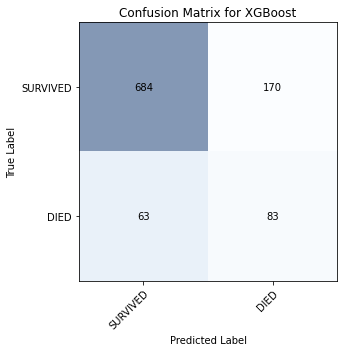

In [55]:
create_confusion_matrix(labels[7000:], y_pred, ["SURVIVED", "DIED"], 'XGBoost')

Accuracy of Model: 0.654
F1 score of Model: 0.3024193548387097
Precision score of Model: 0.21428571428571427
Recall score of Model: 0.5136986301369864


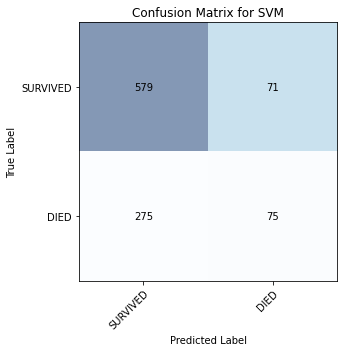

In [53]:
import matplotlib.pyplot as plt
# SVM with weigths
svm_classifier = SGDClassifier(class_weight={0:1, 1:6.13})
svm_classifier.fit(X_train_pca,labels[:7000])
predictions = svm_classifier.predict(X_test_pca)
eval_model(labels[7000:], predictions)
create_confusion_matrix(predictions, labels[7000:], ["SURVIVED", "DIED"], 'SVM')


Accuracy of Model: 0.711
F1 score of Model: 0.23746701846965695
Precision score of Model: 0.19313304721030042
Recall score of Model: 0.3082191780821918


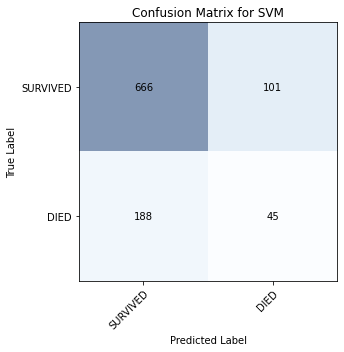

In [50]:
from sklearn.linear_model import SGDClassifier
from sklearn import metrics

svm_classifier = SGDClassifier()
svm_classifier.fit(X_train_pca,labels[:7000])
predictions = svm_classifier.predict(X_test_pca)
eval_model(labels[7000:], predictions)
create_confusion_matrix(predictions, labels[7000:], ["SURVIVED", "DIED"], 'SVM')

Accuracy of Model: 0.611
F1 score of Model: 0.2701688555347092
Precision score of Model: 0.18604651162790697
Recall score of Model: 0.4931506849315068


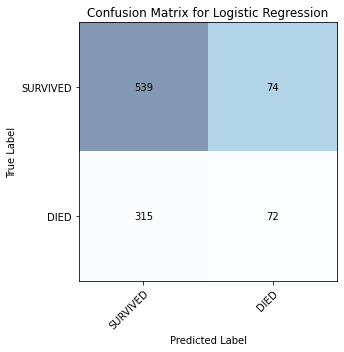

In [46]:
from sklearn.linear_model import SGDClassifier
import matplotlib.pyplot as plt

svm_classifier = SGDClassifier(class_weight={0:1, 1:6.13}, loss='log_loss')
svm_classifier.fit(X_train_pca,labels[:7000])
predictions = svm_classifier.predict(X_test_pca)
eval_model(labels[7000:], predictions)
create_confusion_matrix(predictions, labels[7000:], ["SURVIVED", "DIED"], 'Logistic Regression')

Accuracy of Model: 0.727
F1 score of Model: 0.22662889518413598
Precision score of Model: 0.1932367149758454
Recall score of Model: 0.273972602739726


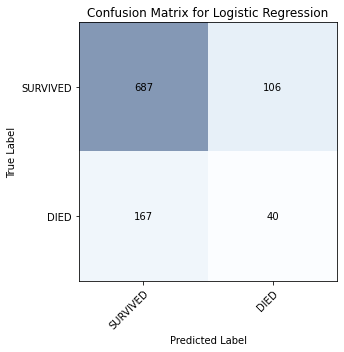

In [45]:
svm_classifier = SGDClassifier(loss='log_loss')
svm_classifier.fit(X_train_pca,labels[:7000])
predictions = svm_classifier.predict(X_test_pca)
eval_model(labels[7000:], predictions)
create_confusion_matrix(predictions, labels[7000:], ["SURVIVED", "DIED"], 'Logistic Regression')